In [17]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
from astropy.modeling import models, fitting
from photutils.aperture import CircularAperture, EllipticalAperture
from photutils.aperture import aperture_photometry

%matplotlib inline
%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')
plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot, cmap='gnuplot2'):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=(0, np.quantile(file, [0.99])), cmap=cmap, origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

# Ratio of Ha and Hb

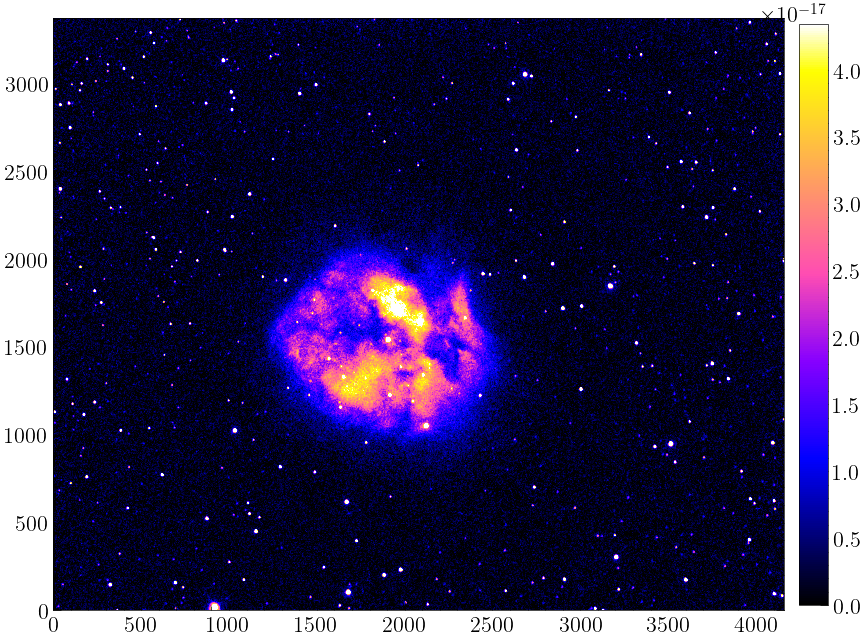

In [3]:
final_Ha_physical = Open_Fits(filepath='Data/final_Ha_physical.fits', plot=True)

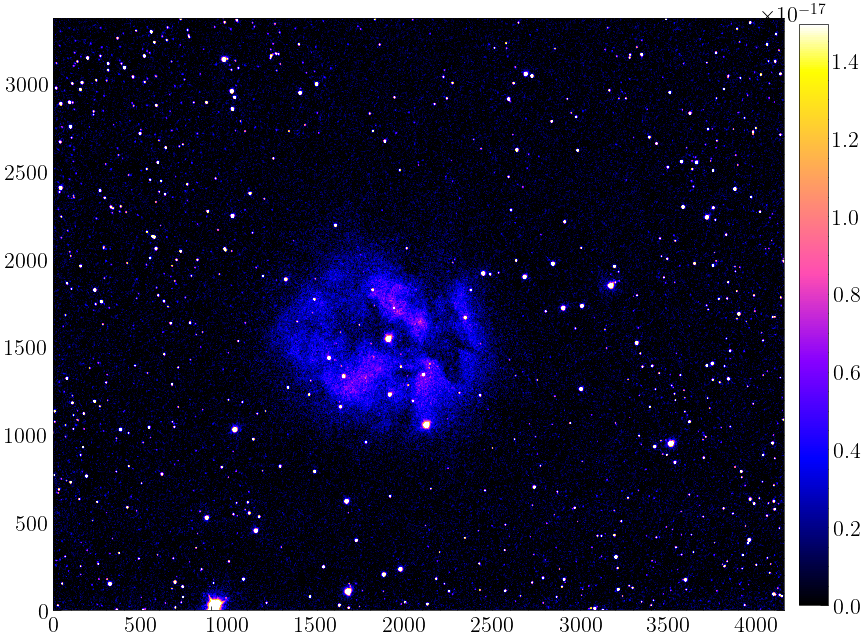

In [4]:
final_Hb_physical = Open_Fits(filepath='Data/final_Hb_physical.fits', plot=True)

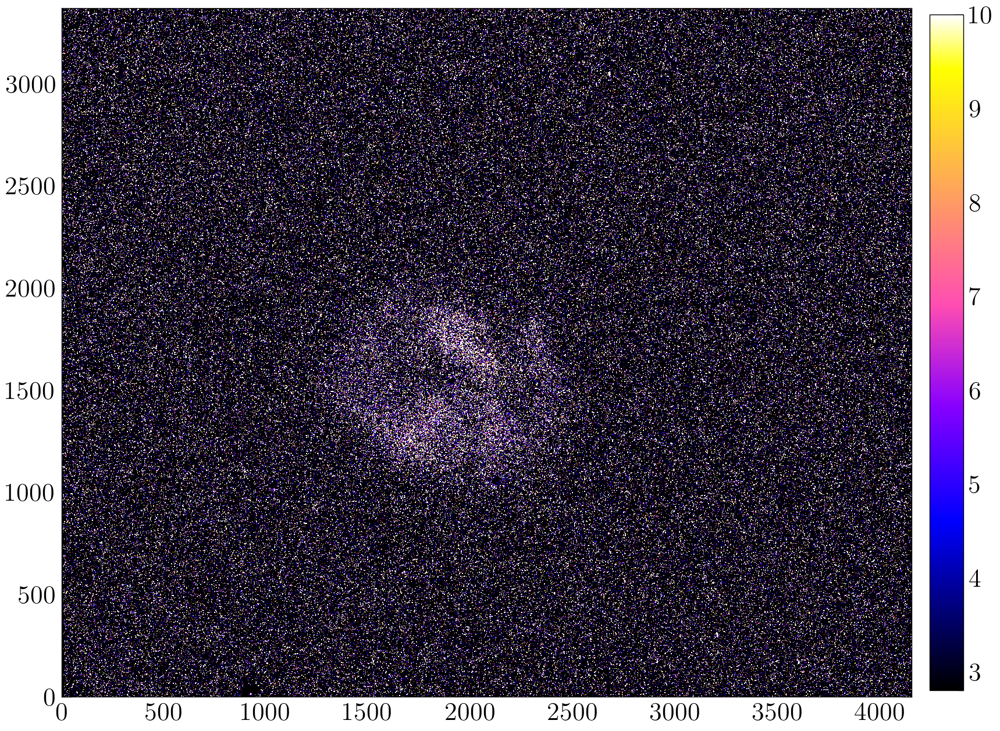

In [26]:
ratio_Ha_Hb = final_Ha_physical / final_Hb_physical

plt.imshow(ratio_Ha_Hb, clim=(2.8,10), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

In [22]:
from astropy.convolution import convolve, convolve_fft, Gaussian2DKernel

gauss_kernel = Gaussian2DKernel(2, 2)

ratio_Ha_Hb_smoothed = convolve_fft(final_Ha_physical, gauss_kernel) / convolve_fft(final_Hb_physical, gauss_kernel)

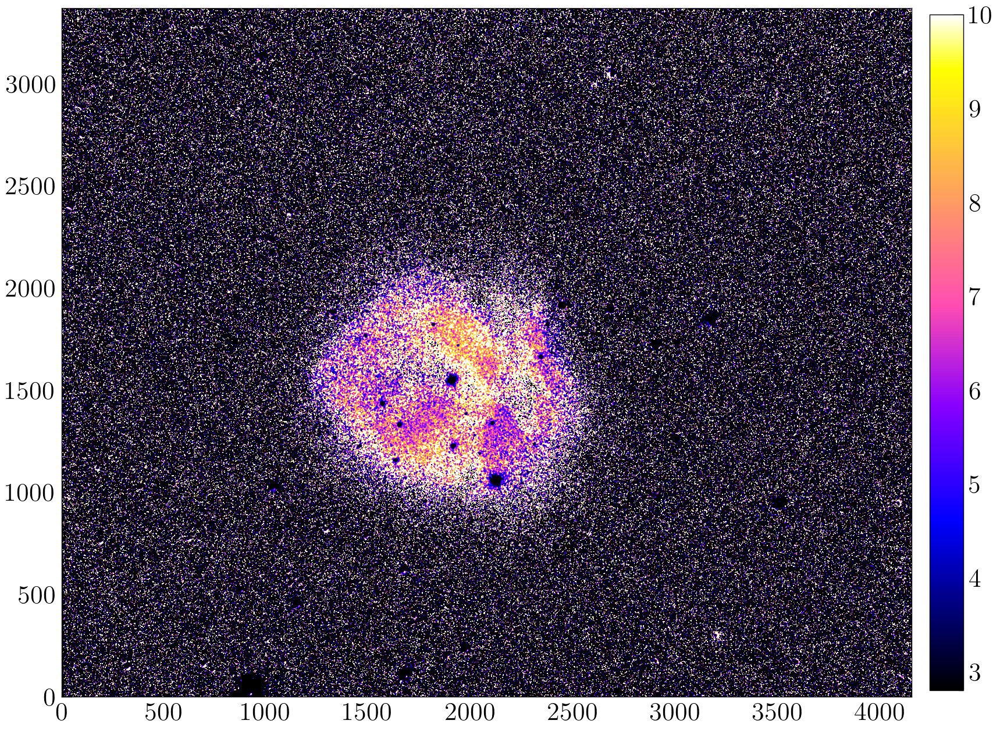

In [25]:
plt.imshow(ratio_Ha_Hb_smoothed, clim=(2.8,10), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

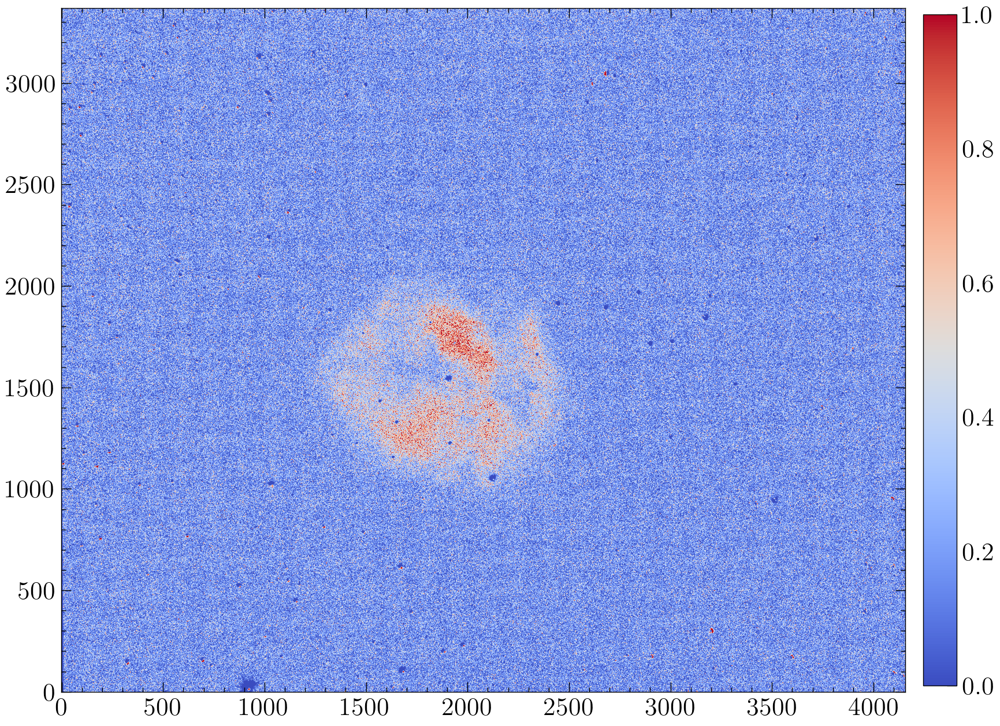

In [57]:
def EBV(image):
    image [image < 2.86] = 2.86
    return 1.97*np.log10(image/2.86)

EBV_Ha_Hb = EBV(ratio_Ha_Hb)

plt.imshow(EBV_Ha_Hb, clim=(0, 1), cmap='coolwarm', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

The observed flux, equal to the emitted flux minus the filtered flux, is given by the formula (Calzetti, 2000):

$$f_{obs}(\lambda) = f_{emit}(\lambda) \times 10^{-0.4 \times k(\lambda) \times E(B-V)}$$

$$k(\lambda) = 
\begin{cases}
      2.659 \times (-2.156+\frac{1.509}{\lambda}-\frac{10.198}{\lambda^2}+\frac{0.011}{\lambda^3}) + 4.05 \:\:\:\:\: & for \:\: 0.12\mu m \leq \lambda \leq 0.63\mu m \\
      2.659 \times (-1.857+\frac{1.040}{\lambda}) + 4.05 & for \:\: 0.63\mu m < \lambda \leq 2.20\mu m
\end{cases}$$

The term $E(B-V) \in [0,1]$ describes the amount of dust. In particular, $E(B-V)=0$ corresponds to zero dust attenuation, while $E(B-V)=1$ means maximum dust attenuation.

k_{Calzetti} = 3.31


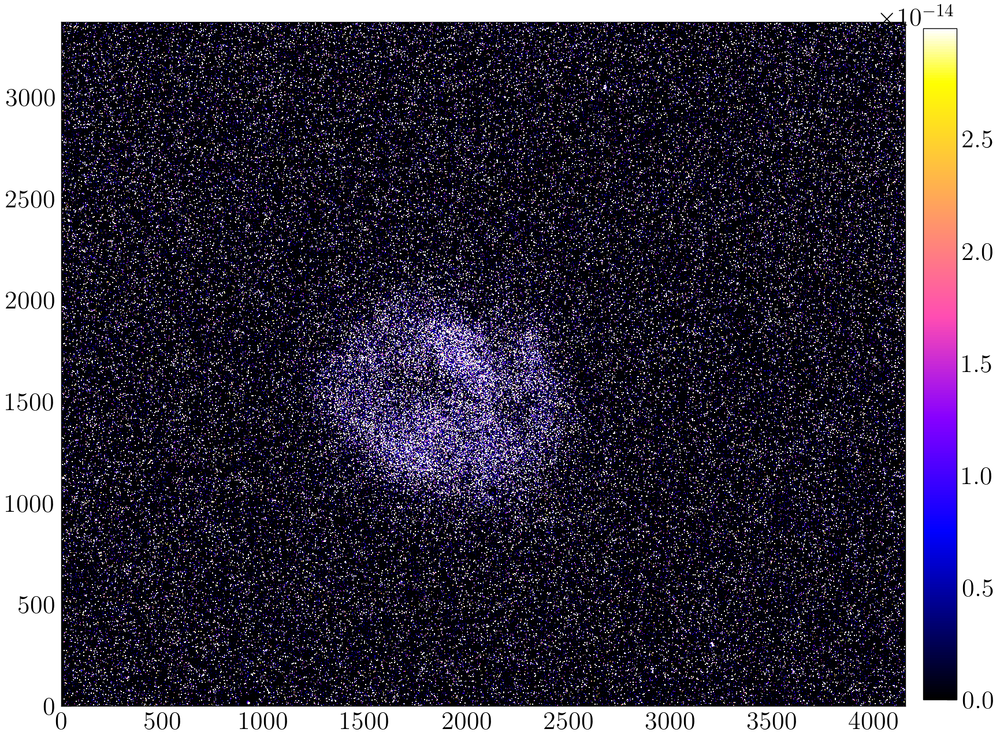

In [47]:
def dust_att_k(wav):
    wav_um = wav/(10**4)
    k1 = 2.659*(-2.156 + 1.509/wav_um - 0.198/(wav_um**2) + 0.011/(wav_um**3)) + 4.05
    k2 = 2.659*(-1.857 + 1.040/wav_um) + 4.03 
    k = np.where(wav_um<=0.63, k1, k2)
    return k

def Emitted_Flux(image, wav, EBV):
    k = dust_att_k(wav)
    print(f'k_{{Calzetti}} = {k:.2f}')
    return image*10**(0.4*k*EBV)

Emitted_Ha = Emitted_Flux(final_Ha_physical, 6563, EBV_Ha_Hb)
plt.imshow(Emitted_Ha, clim=(0, np.quantile(Emitted_Ha, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

k_{Calzetti} = 4.60


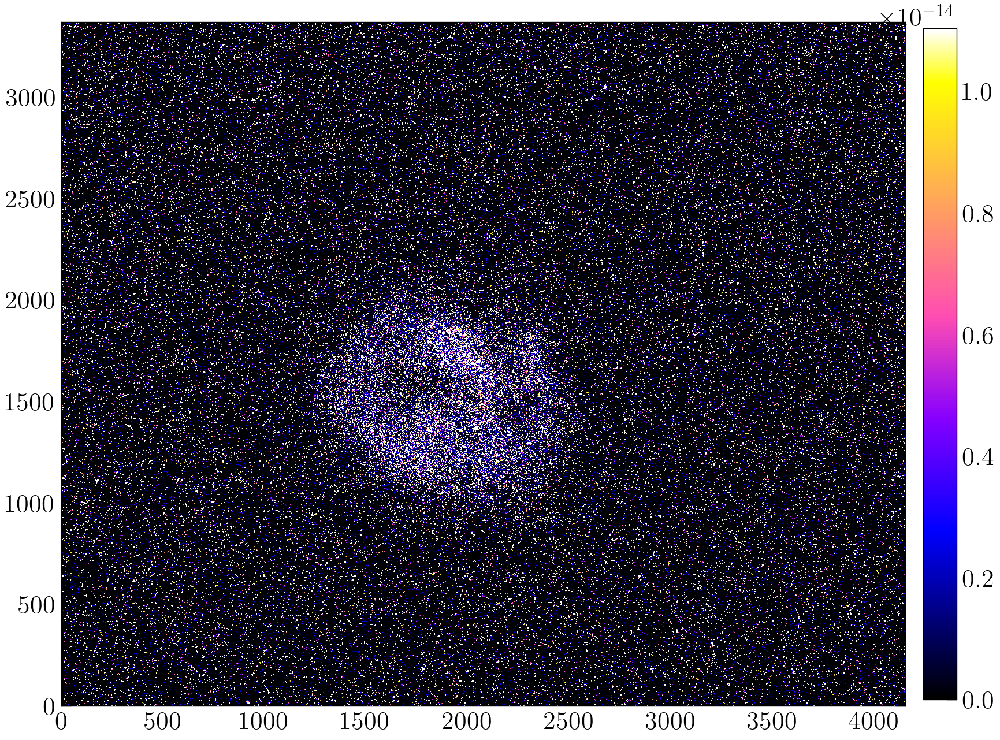

In [48]:
Emitted_Hb = Emitted_Flux(final_Hb_physical, 4861, EBV_Ha_Hb)
plt.imshow(Emitted_Hb, clim=(0, np.quantile(Emitted_Hb, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);